In [2]:
import math, random, numpy
random.seed(0)

# def step_sample(i): 
#     return i / samplesize

def uniform_sample():
    return random.uniform(0, 1)

def multi_sample(fun, dimensions):
    samples = [0] * dimensions
    return [fun() for sample in samples]

def crusp(xs):
    return xs[0]**3 - xs[0] * xs[1]

fineness = 200
samplesize = 50000

def sample(fun, sample_fun, samplesize, fineness, yStart, yEnd, dimensions):
    xs = [[0] * dimensions] * samplesize
    ys_histogram = [0] * fineness * (yEnd - yStart)

    for i in range(0, samplesize):
        xs[i] = multi_sample(sample_fun, dimensions)
        rand = int(fun(xs[i]) * fineness * (yEnd - yStart)) # apply function and map to correct position
        ys_histogram[rand] = ys_histogram[rand] + 1

    #     rand = rand * fineness
    #     if rand < fineness:
    #         ys_histogram[int(rand)] = ys_histogram[int(rand)] + 1
    #     else:
    #         ys_histogram[fineness - 1] = ys_histogram[fineness - 1] + 1
    return xs, ys_histogram

xs, ys_histo = sample(crusp, uniform_sample, samplesize, fineness, -2, 2, 2)

beta1 = numpy.transpose(xs)[1]
beta2 = numpy.linspace(-2, 2, fineness * 4)
density = ys_histo

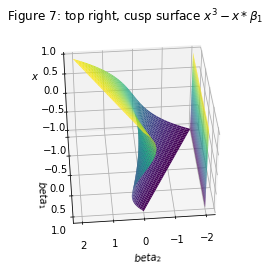

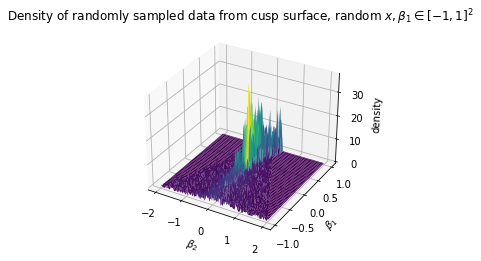

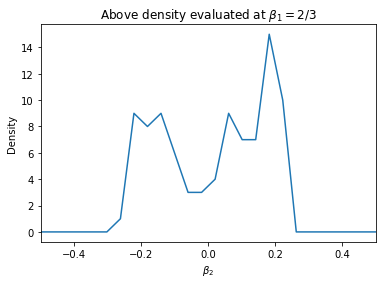

In [3]:
import matplotlib.pyplot as plt
import math, random, numpy

random.seed(0)

# crusp surface
X, Y = numpy.meshgrid(numpy.linspace(-1, 1, 100), numpy.linspace(-1, 1, 100))
Z = X**3 - X * Y
  
fig = plt.figure()
ax = plt.axes(projection ='3d')
ax.set_title('Figure 7: top right, cusp surface $x^3 - x*\\beta_1$')
ax.plot_surface(Z, Y, X, cmap='viridis', edgecolor='none')
ax.plot_surface(-2, Y, X, cmap='viridis', edgecolor='none')
ax.set_xlabel('$beta_2$')
ax.set_ylabel('${beta}_1$')
ax.set_zlabel('$x$')
ax.azim = 85
ax.elev = 40
plt.show()

def crusp(xs):
    return xs[0]**3 - xs[0] * xs[1]

fineness = 100
samplesize = 10000

samples = [[random.uniform(-1, 1), random.uniform(-1, 1)] for i in range(0, samplesize)]
samples = [[x[0], x[1], crusp(x)] for x in samples]
#print(samples)
samples.sort(key = lambda vals: vals[1]) # This ensures positive beta1 TODO: is this the right approach?
#print(samples)

mapped_samples = [[x[0], int((x[1] + 1) / 2 * fineness), int((crusp(x) + 2) / 4 * fineness)] for x in samples]
density = numpy.zeros((fineness, fineness))

for sample in mapped_samples:
    i = sample[1]
    j = sample[2]

    density[j][i] = density[j][i] + 1 # TODO: why j and i swapped?

x = numpy.linspace(-1, 1, fineness)
y = numpy.linspace(-2, 2, fineness)
   
beta1_grid, beta2_grid = numpy.meshgrid(x, y)

fig = plt.figure()
ax = plt.axes(projection ='3d')
ax.plot_surface(beta2_grid, beta1_grid, density, cmap='viridis', edgecolor='none')
ax.set_xlabel('$\\beta_2$')
ax.set_ylabel('$\\beta_1$')
ax.set_zlabel('density')

plt.title("Density of randomly sampled data from cusp surface, random $x, \\beta_1 \\in [-1,1]^2 $")
plt.show()

beta1_2_3_in_pos = int((2/3 + 1) / 2 * fineness) # position of beta1 = 2/3
plt.plot(numpy.linspace(-2, 2, fineness), numpy.transpose(density)[beta1_2_3_in_pos])
plt.xlim([-0.5, 0.5])
plt.title("Above density evaluated at $\\beta_1 = 2/3$")
plt.ylabel("Density")
plt.xlabel("$\\beta_2$")
plt.show()


#plt.title("Parameterized curve todo text $")
#plt.show()

#plt.plot(density, [T(x) for x in xs], 0)
#plt.show()

#print(density.tolist())

#fineness = 200
#samplesize = 50000

#meshsize_beta1 = 10
#meshsize_beta2 = 2 * meshsize_beta1

#histogram = [[0] * meshsize_beta2] * meshsize_beta1
#print(histogram)

#print(numpy.mgrid[-5:5.1:0.5, -5:5.1:0.5])

#beta1_space = numpy.linspace(-1, 1, meshsize_beta1)
#print(beta1_space)

#x = random.uniform(-1, 1)
#beta1_index = int(random.random() * 10)

#print(x)
#print(beta1_index)

#beta1_start = int(random.random() * 10)
#beta1 = beta1_space[beta1_index]
#beta2 = crusp([x, beta1]) # ranges from [-2, 2]

#betas1 = [beta1_space[i] for i in range(beta1_start, meshsize_beta1)]
#betas2 = [crusp([x, beta1]) for beta1 in betas1]

#print([x, betas1, betas2])

[[-0.05991336 -1.63431248 -1.05587927]
 [-0.01284427 -1.05587927 -1.00597365]
 [ 0.59291147 -1.00597365 -0.40112882]
 ...
 [-0.37794155  1.00309866  1.37680227]
 [-0.32450814  1.37680227  1.32359786]
 [-0.96098052  1.32359786  1.9600424 ]]
[[ 1.89527474 -0.16780287 -0.40917726]
 [ 1.4473234  -0.17345782 -0.03688886]
 [ 0.91380028 -0.70127417 -0.45165486]
 ...
 [-1.62273622  0.58871019 -0.24698674]
 [-1.85526189  0.55237941  0.05293344]
 [-2.18353868  1.25354163 -0.40923033]]


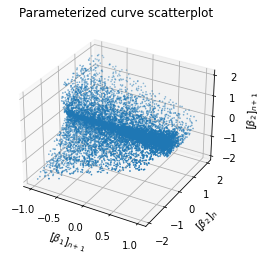

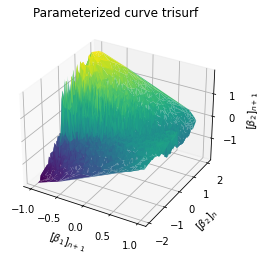

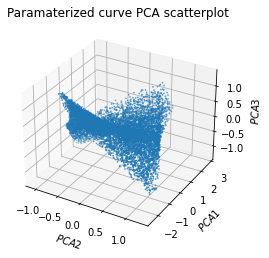

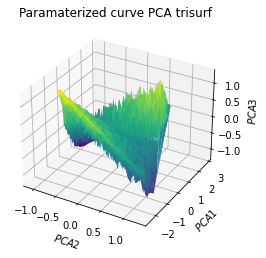

In [36]:
from sklearn.decomposition import PCA

samples_parameterized = [[0] * 3] * (samplesize - 1)

for i in range(0, samplesize - 1):
    samples_parameterized[i] = [samples[i+1][1], samples[i][2], samples[i+1][2]]

print(numpy.array(samples_parameterized))

pca = PCA()
pca.n_components = 3

data = pca.fit_transform(samples_parameterized)

print(data)

ax = plt.axes(projection='3d')
ax.scatter(numpy.transpose(samples_parameterized)[0], numpy.transpose(samples_parameterized)[1], numpy.transpose(samples_parameterized)[2], s=0.5)
ax.set_xlabel("$[\\beta_1]_{n+1}$")
ax.set_ylabel("$[\\beta_2]_{n}$")
ax.set_zlabel("$[\\beta_2]_{n+1}$")
plt.title("Parameterized curve scatterplot")
plt.show()

fig = plt.figure()
ax = plt.axes(projection ='3d')
ax.plot_trisurf(numpy.transpose(samples_parameterized)[0], numpy.transpose(samples_parameterized)[1], numpy.transpose(samples_parameterized)[2], cmap='viridis', edgecolor='none')
ax.set_xlabel("$[\\beta_1]_{n+1}$")
ax.set_ylabel("$[\\beta_2]_{n}$")
ax.set_zlabel("$[\\beta_2]_{n+1}$")
plt.title("Parameterized curve trisurf")
plt.show()

ax = plt.axes(projection='3d')
ax.scatter(numpy.transpose(data)[1], numpy.transpose(data)[0], numpy.transpose(data)[2], s=0.5)
ax.set_xlabel("$PCA 2$")
ax.set_ylabel("$PCA 1$")
ax.set_zlabel("$PCA 3$")
plt.title("Paramaterized curve PCA scatterplot")
plt.show()


fig = plt.figure()
ax = plt.axes(projection ='3d')
ax.plot_trisurf(numpy.transpose(data)[1], numpy.transpose(data)[0], numpy.transpose(data)[2], cmap='viridis', edgecolor='none')
ax.set_xlabel("$PCA 2$")
ax.set_ylabel("$PCA 1$")
ax.set_zlabel("$PCA 3$")
plt.title("Paramaterized curve PCA trisurf")
plt.show()


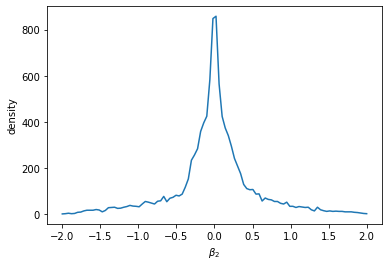

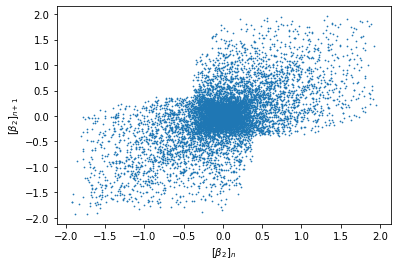

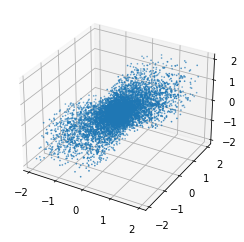

In [43]:
samples.sort(key = lambda vals: vals[0]) # sort after x

beta2_values_line = [int((x + 2) / 4 * fineness) for x in numpy.transpose(samples)[2]]
beta2_density = [0] * fineness

for x in beta2_values_line:
    beta2_density[x] = beta2_density[x] + 1

plt.plot(numpy.linspace(-2, 2, fineness), beta2_density)
plt.xlabel("$\\beta_2$")
plt.ylabel("density")
plt.show()

def lags (list, n):
    lagged_lists = []
    
    for i in range(0, n + 1):
        new_lag = list[i:(len(list) - (n - i))]
        lagged_lists.append(new_lag)

    return lagged_lists

beta2_n, beta2_n1 = lags(numpy.transpose(samples)[2], 1)

plt.scatter(beta2_n, beta2_n1, s=0.5)
plt.xlabel("$[\\beta_2]_n$")
plt.ylabel("$[\\beta_2]_{n+1}$")
plt.show()

beta2_n, beta2_n1, beta2_n2 = lags(numpy.transpose(samples)[2], 2)

ax = plt.axes(projection='3d')
ax.scatter(beta2_n, beta2_n1, beta2_n2, s=0.5)
plt.show()